In [31]:
# !pip install cufflinks
# !pip install plotly
# !pip install seaborn
# !pip install pandas_datareader
# !pip install yfinance

In [32]:
# Import key librares and modules 
import pandas as pd
import numpy as np

# datetime offers classes that work with date & time information
import datetime as dt

# Matplotlib is a comprehensive data visualization library in Python 
# Seaborn is a visualization library that sits on top of matplotlib and offers enhanced features 
# plotly.express module contains functions that can create interactive figures using a few lines of code
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio

# Let's plot a candlestick graph using Cufflinks library
# Cufflinks is a powerful Python library that connects Pandas and Plotly for generating plots using few lines of code
# Cufflinks allows for interactive data visualization
import cufflinks as cf
cf.go_offline() # Enabling offline mode for interactive data visualization locally

# Plot volatility vs. return for all simulation runs
import plotly.graph_objects as go

In [33]:
# # Code to obtain stock data using Pandas Datareader
# tickers = ['AMZN', 'JPM', 'META', 'PG', 'GOOGL', 'CAT', 'PFE', 'EXC', 'DE', 'JNJ'] 

# # Library provides functions to extract financial data from various online sources, including Yahoo Finance.
# from pandas_datareader import data as pdr
# import yfinance as yfin
# yfin.pdr_override()

# # Indicate the start and end dates
# start = dt.datetime(2018, 1, 1)
# end = dt.datetime.now()

# # Data is saved in a stock_data.csv file
# df = pdr.get_data_yahoo(tickers, start = start, end = end)
# print(df)
# df.to_csv('stock_data.csv')


In [34]:
# Note that yfinance and Pandas Datareader might experience outage in some geographical regions
  
# AMZN: Amazon Inc. - Multinational tech company focusing on e-commerce, cloud computing, and artificial intelligence
# JPM: JPMorgan Chase and Co. - Multinational investment bank and financial services holding company
# META: Meta Platforms, formerly named Facebook Inc. - META owns Facebook, Instagram, and WhatsApp
# PG: Procter and Gamble (P&G) - Multinational consumer goods corporation
# GOOG: Google (Alphabet Inc.) - Multinational company that focuses on search engine tech, e-commerce, Cloud and AI 
# CAT: Caterpillar - World's largest construction-equipment manufacturer
# PFE: Pfizer Inc. - Multinational pharmaceutical and biotechnology corporation
# EXC: Exelon - An American Fortune 100 energy company 
# DE: Deere & Company (John Deere) - Manufactures agricultural machinery and heavy equipment
# JNJ: Johnson & Johnson - A multinational corporation that develops medical devices and pharmaceuticals

close_price_df = pd.read_csv('Stock_prices.csv')
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [35]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price_df.iloc[:, 1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df


,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...
2252,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [36]:
# # Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price_df['Date'])
daily_returns_df



,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1/3/2014,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,1/6/2014,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1/7/2014,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,1/8/2014,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,12/13/2022,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,12/14/2022,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,12/15/2022,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [37]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 3)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [38]:
# Plot closing prices using plotly Express. Note that I used the same pre-defined function "plot_financial_data"
plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')


In [39]:
# Plot the stocks daily returns
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

In [40]:
# Plot histograms for stocks daily returns using plotly express
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})

<Axes: >

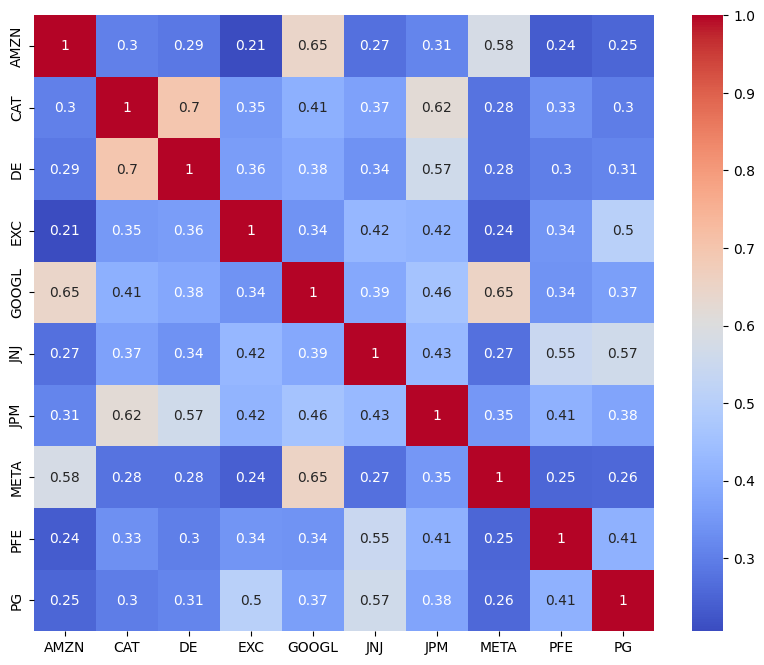

In [41]:
# Plot a heatmap showing the correlations between daily returns
# Strong positive correlations between Catterpillar and John Deere - both into heavy equipment and machinery
# META and Google - both into Tech and Cloud Computing
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True, cmap='coolwarm')

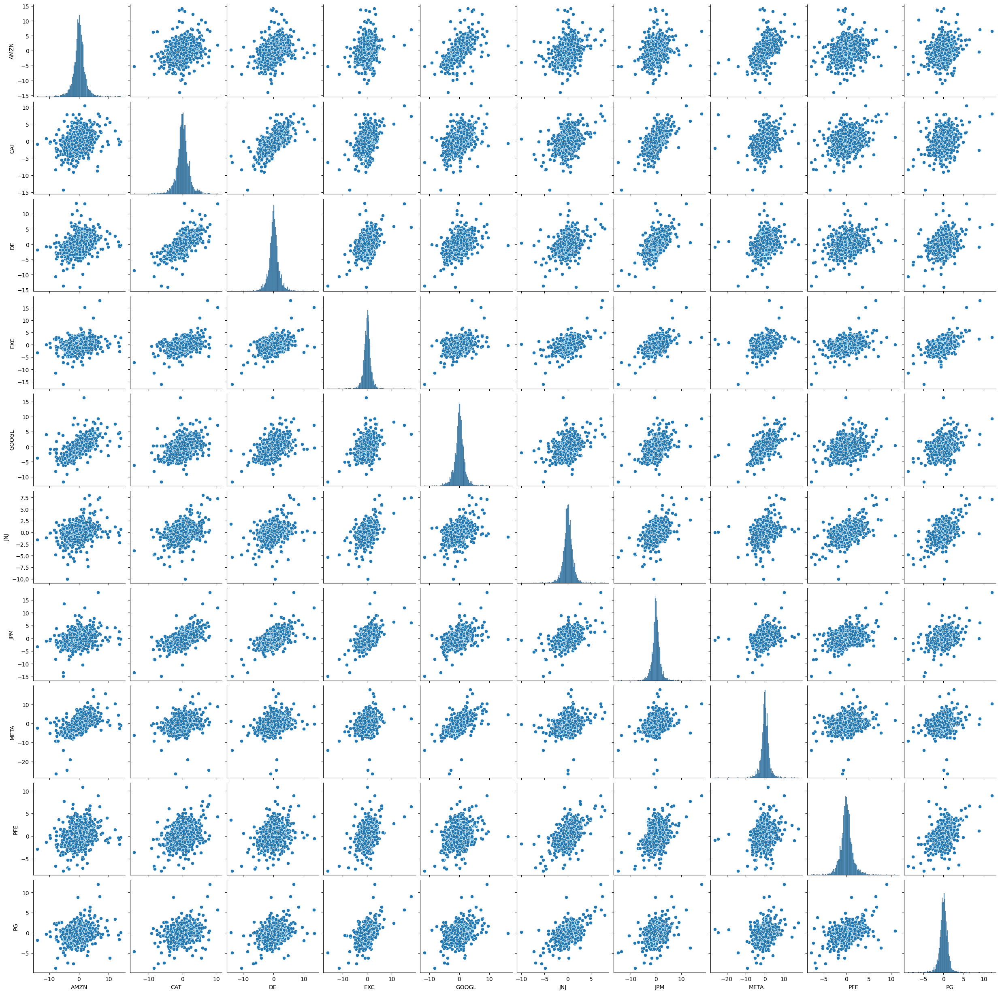

In [42]:
# Plot the Pairplot between stocks daily returns
sns.pairplot(daily_returns_df)

In [43]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [44]:
price_scaling(close_price_df)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [45]:
# Plot closing prices using plotly Express. Note that I used the same pre-defined function "plot_financial_data"
plot_financial_data(price_scaling(close_price_df), 'Scaled Adjusted Closing Prices [$]')

In [46]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights

In [47]:
# Call 10 random number
weights = generate_portfolio_weights(10)
print(weights)

[0.07183298 0.1408083  0.12313862 0.07704711 0.06760395 0.1469383
 0.00164265 0.1041559  0.12575461 0.14107758]


In [48]:
# Scale stock prices using the "price_scaling" function that I defined earlier (make all stock values start at 1)
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [49]:
# Use enumerate() method to obtain the stock names along with a counter "i" (0, 1, 2, 3,..etc.)
# This counter "i" will be used as an index to access elements in the "weights" list
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,71833.0,140808.3,123138.6,77047.1,67603.9,146938.3,1642.7,104155.9,125754.6,141077.6
1,1/3/2014,71556.8,140730.0,123684.3,75487.4,67110.8,148261.9,1655.4,103870.3,126002.3,140919.9
2,1/6/2014,71049.6,138881.2,122661.1,75969.5,67859.0,149036.8,1664.9,108896.3,126126.2,141252.7
3,1/7/2014,71843.8,139335.5,123206.8,76366.5,69167.2,152200.5,1645.8,110267.0,126910.6,142619.0
4,1/8/2014,72546.0,139664.5,121883.5,76196.4,69311.2,151990.7,1661.3,110857.2,127777.6,140552.1
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,326882.8,472098.7,711677.8,231888.8,226455.9,365765.6,4830.4,218382.8,314159.9,347264.6
2253,12/13/2022,333886.1,477021.1,711905.8,232107.0,232086.4,368583.3,4825.7,228739.4,319640.8,346740.8
2254,12/14/2022,330601.0,474975.1,713941.2,233634.7,230727.3,369714.5,4801.6,231480.8,328133.2,348107.3
2255,12/15/2022,319301.8,467237.1,699855.9,231234.0,220510.0,365045.8,4682.5,221124.3,322893.2,344167.1


In [50]:
# Assume that we have $1,000,000 that we would like to invest in one or more of the selected stocks
# Let's create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that was defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [51]:
# Now let's put this code in a function and generate random weights
# Let's obtain the number of stocks under consideration (ignored the "Date" column) 
n = len(close_price_df.columns)-1

# Let's generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 10
Portfolio weights = [0.05182  0.126519 0.141703 0.107793 0.072934 0.0902   0.069988 0.068352
 0.163128 0.107564]


,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG,Portfolio Value [$],Portfolio Daily Return [%]
0,1/2/2014,51820.00,126519.00,141703.00,107793.00,72934.00,90200.00,69988.00,68352.00,163128.00,107564.00,1000001.00,0.00
1,1/3/2014,51620.78,126448.65,142331.00,105610.94,72401.96,91012.50,70529.06,68164.60,163449.35,107443.79,999012.64,-0.10
2,1/6/2014,51254.88,124787.44,141153.52,106285.44,73209.19,91488.16,70937.85,71462.89,163610.01,107697.55,1001886.93,0.29
3,1/7/2014,51827.81,125195.65,141781.49,106840.85,74620.54,93430.28,70120.27,72362.42,164627.52,108739.26,1009546.09,0.76
4,1/8/2014,52334.33,125491.31,140258.62,106602.77,74775.83,93301.46,70781.55,72749.72,165752.19,107163.37,1009211.15,-0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,235811.80,424189.89,818970.33,324424.70,244310.26,224530.01,205808.03,143313.07,407525.97,264770.45,3293654.49,1.18
2253,12/13/2022,240863.96,428612.72,819232.69,324730.05,250384.63,226259.70,205608.67,150109.54,414635.80,264371.05,3324808.82,0.95
2254,12/14/2022,238494.14,426774.41,821575.02,326867.42,248918.41,226954.08,204581.24,151908.60,425652.13,265412.96,3337138.41,0.37
2255,12/15/2022,230342.93,419821.69,805366.15,323508.68,237895.52,224088.13,199505.43,145112.14,418854.83,262408.75,3266904.24,-2.10


In [52]:
# Plot the portfolio percentage daily return
plot_financial_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_financial_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

In [53]:
# Let's define the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that I dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # Check out the chart for the 10-years U.S. treasury at https://ycharts.com/indicators/10_year_treasury_rate
    rf = 0.046 

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [54]:
# Let's test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [55]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))


Expected Portfolio Annual Return = 16.17%
Portfolio Standard Deviation (Volatility) = 17.54%
Sharpe Ratio = 0.66
Portfolio Final Value = $3248674.79
Return on Investment = 224.87%


In [56]:
# If I want to make equal weighted instead of random weight 
equal_weight = np.ones(10)*0.1
equal_weight

array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

In [57]:
initial_investment = 1000000
portfolio_metrics = simulation_engine(equal_weight, initial_investment)

In [58]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 16.30%
Portfolio Standard Deviation (Volatility) = 18.02%
Sharpe Ratio = 0.65
Portfolio Final Value = $3203874.76
Return on Investment = 220.39%


In [59]:
# Morto carlo simulation

In [60]:
# Set the number of simulation runs
sim_runs = 1000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.093 0.119 0.125 0.122 0.088 0.075 0.093 0.122 0.151 0.012], Final Value = $3283922.62, Sharpe Ratio = 0.65


Simulation Run = 1
Weights = [0.021 0.053 0.061 0.152 0.067 0.103 0.042 0.127 0.189 0.185], Final Value = $2851256.33, Sharpe Ratio = 0.60


Simulation Run = 2
Weights = [0.085 0.067 0.084 0.105 0.173 0.039 0.121 0.168 0.024 0.134], Final Value = $3139040.86, Sharpe Ratio = 0.61


Simulation Run = 3
Weights = [0.141 0.109 0.039 0.088 0.12  0.01  0.031 0.186 0.125 0.151], Final Value = $3051952.18, Sharpe Ratio = 0.60


Simulation Run = 4
Weights = [0.143 0.018 0.083 0.157 0.039 0.105 0.069 0.145 0.112 0.128], Final Value = $3117155.32, Sharpe Ratio = 0.64


Simulation Run = 5
Weights = [0.078 0.035 0.068 0.198 0.131 0.016 0.215 0.135 0.011 0.114], Final Value = $3105149.73, Sharpe Ratio = 0.60


Simulation Run = 6
Weights = [0.167 0.097 0.122 0.166 0.092 0.064 0.02  0.116 0.129 0.028], Final Value = $3398444.58, Sharpe Ratio = 0.67


Simulation Ru

In [61]:
# List all Sharpe ratios generated from the simulation
sharpe_ratio_runs

array([0.64955915, 0.60159531, 0.60791866, 0.60334194, 0.63959152,
       0.60496702, 0.6702501 , 0.61029742, 0.64408925, 0.58673343,
       0.65492146, 0.62718755, 0.66012219, 0.62667867, 0.62193268,
       0.68536949, 0.65691932, 0.61751966, 0.6866054 , 0.6279336 ,
       0.67168005, 0.59402223, 0.62647458, 0.69433307, 0.61492141,
       0.6526834 , 0.60079523, 0.63293041, 0.59172397, 0.64209436,
       0.68526072, 0.63690026, 0.69170877, 0.68324042, 0.65614927,
       0.63544893, 0.62278403, 0.64775631, 0.64650005, 0.65796462,
       0.66733149, 0.66408323, 0.63536756, 0.62016921, 0.60718185,
       0.61636138, 0.67163768, 0.61149382, 0.71215284, 0.61224258,
       0.60800038, 0.62285464, 0.63480772, 0.63056117, 0.62476223,
       0.64645092, 0.65694564, 0.62107454, 0.5604589 , 0.67618971,
       0.62792541, 0.65612325, 0.58297629, 0.64056578, 0.63099803,
       0.65742856, 0.69376849, 0.64009333, 0.63122134, 0.63016625,
       0.65660897, 0.60177461, 0.57040936, 0.64535446, 0.62984

In [62]:
# Return the index of the maximum Sharpe ratio (Best simulation run) 
sharpe_ratio_runs.argmax()

621

In [63]:
# Return the maximum Sharpe ratio value
sharpe_ratio_runs.max()

0.7201810720838109

In [64]:
weights_runs

array([[0.09312313, 0.11879658, 0.1249459 , ..., 0.12183709, 0.15076014,
        0.01227453],
       [0.02099918, 0.05309925, 0.06118064, ..., 0.12663545, 0.18879838,
        0.18472001],
       [0.08511741, 0.0665891 , 0.0835203 , ..., 0.16801971, 0.02406908,
        0.13403719],
       ...,
       [0.12769333, 0.05810605, 0.18646844, ..., 0.12596536, 0.08608081,
        0.09130891],
       [0.02597709, 0.04407091, 0.18113934, ..., 0.21395401, 0.04713908,
        0.03621046],
       [0.01179153, 0.15003033, 0.00128723, ..., 0.18952151, 0.01185785,
        0.03280295]])

In [65]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.20591743, 0.07283693, 0.26596588, 0.01770713, 0.01277893,
       0.17661111, 0.00842184, 0.06538288, 0.12149018, 0.05288769])

In [66]:
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [67]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 1000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 18.01%
  - Portfolio Standard Deviation (Volatility) = 18.63%
  - Sharpe Ratio = 0.72
  - Final Value = $3791613.53
  - Return on Investment = 279.16%


In [68]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 
                           'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 
                           'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.187387,0.167719,0.649559
1,0.168016,0.147078,0.601595
2,0.194506,0.164244,0.607919
3,0.192473,0.162127,0.603342
4,0.178336,0.160062,0.639592
...,...,...,...
995,0.191971,0.172387,0.658365
996,0.181111,0.161557,0.638045
997,0.193675,0.174155,0.661699
998,0.186044,0.163419,0.631133


In [69]:
# Plot volatility vs. return for all simulation runs
# Highlight the volatility and return that corresponds to the highest Sharpe ratio
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, 
                 x = 'Volatility', 
                 y = 'Portfolio_Return', 
                 color = 'Sharpe_Ratio', 
                 size = 'Sharpe_Ratio', 
                 hover_data = ['Sharpe_Ratio'] )
                 
fig.update_layout({'plot_bgcolor': "white"})
fig.show()


# Use this code if Sharpe ratio is negative
# fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'])

In [70]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, 
                 x = 'Volatility', 
                 y = 'Portfolio_Return', 
                 color = 'Sharpe_Ratio', 
                 size = 'Sharpe_Ratio', 
                 hover_data = ['Sharpe_Ratio'] )

fig.add_trace(go.Scatter(x = [optimal_volatility], 
                         y = [optimal_portfolio_return], 
                         mode = 'markers', 
                         name = 'Optimal Point', 
                         marker = dict(size=[40], 
                         color = 'red')))
                         
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

In [71]:
# Check the volatality of portfolio thats generated by 10,000 random simulation
fig = px.line(sim_out_df, y = 'Volatility')
fig.show()